# **Лабораторная работа**
*Naumov Anton (Any0019)*

*To contact me in telegram: @any0019*

В данном задании вашей задачей будет построить и обучить модель CycleGAN для задачи Img2Img.

---

Про задачу __Img2Img__:

- У вас есть 2 множества изображений ($A$ и $B$)
- Ваша задача - научиться превращать изображения из множества $A$ в изображения из множества $B$ и наоборот
- Бывают paired и unpaired множества
- В случае __paired__ множеств - для каждого изображения из $A$ существует конкретное изображение из $B$, в которое оно должно перейти (и наоборот). Примером такой пары множеств может быть (а) спутниковая фотграфия местности vs схематическая карта местности , (б) фотография фасада здания vs схема фасада здания , ...
- В случае __unpaired__ множеств - между множествами нет конкретных пар. Примером такой пары множеств может быть (а) фотографии с лошадьми vs фотографии с зебрами , (б) фотографии vs рисунки конкретного художника , ...

---

Про модель __CycleGAN__:

- Модель придумана для задачи Img2Img (в первую очередь unpaired версии) и основана на концепции GAN-ов
- В модели есть 2 генератора: $G_{A -> B}$ (задача которого - принимая на вход изображение из множества $A$ переводить его в изображение из множества $B$) и $G_{B -> A}$ (аналогично в другую сторону)
- Надо отметить что на вход генераторы не получают никакую дополнительную случайность, что делает обучение таких моделей проще
- В модели так же есть 2 дискриминатора: $D_{A}$ (задача которого - отличать реальные изображения из $A$ от сгенерированных с помощью $G_{B -> A}$ изображений) и $D_{B}$ (аналогично для $B$)
- Функцией ошибки будет, как и для GAN-ов, minmax игра между генераторами и дискриминаторами, но к ошибке генераторов добавится ещё и, так называемый, `cycle consistency loss`, который проверяет, что после двойного перехода изображения не меняются $G_{B -> A} \big( G_{A -> B} ( a ) \big) = a ; \forall a \in A$ и $G_{A -> B} \big( G_{B -> A} ( b ) \big) = b ; \forall b \in B$
- Так же можно добавлять или нет штраф за то, чтобы $G_{B -> A}$ не меняла изображения из $A$ и наоборот $G_{A -> B}$ не меняла изображения из $B$
- Оригинальная статья: https://arxiv.org/pdf/1703.10593.pdf

---

Ваша задача - ноутбук разбит на несколько частей, каждая со своими баллами

1. __Подготовка данных__ _(2 балла)_ --> требуется выбрать датасет для обучения (дано несколько на выбор) и составить пайплайн подготовки данных
2. __Составление модели__ _(6 баллов)_ --> требуется собрать нейросеть _(3 балла)_ и создать функции ошибки _(3 балла)_
3. __Подготовка обучения__ _(2 балла)_ --> требуется написать шаги обучения и валидации, визуализацию, а так же полный цикл обучения
4. __Обучение__ _(2 балла)_ --> требуется обучить модель
5. __Сбор своего датасета и обучение модели на нём__ _(3 балла)_ --> требуется собрать свой датасет и обучить на нём модель

***За наиболее интересные и качественные решения в пункте 5 так же предусмотрены дополнительные баллы***

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

from torchvision import datasets, transforms as tr

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('dark_background')

from tqdm.auto import tqdm, trange
import os
import sys
import requests
import cv2

from dataclasses import dataclass

# 1. Подготовка данных (___2 балла___)

## 1.1 Выбор и скачивание датасета

## 1.2 Dataset и Transforms

В папке `target_folder` находятся несколько папок со сплитами для соответствующего датасета, в каждой папке сплита находятся сами `.jpg` изображения.

Давайте составим их в удобном для нас виде в отдельные датасеты для каждого сплита без лэйблов.

Для получения картинок можно использовать
```python
cv2.imread(img_path)[:, :, ::-1]  # каналы записаны в обратном порядке
```

In [2]:
import os
from PIL import Image
from torch.utils.data import Dataset
from dataclasses import dataclass

class ImageDatasetNoLabel(Dataset):
    def __init__(self, folder_path, transforms=None):
        super().__init__()
        self.folder_path = folder_path
        self.transform = transforms
        self.image_files = sorted(
            [
                os.path.join(folder_path, f)
                for f in os.listdir(folder_path)
                if f.lower().endswith((".jpg", ".jpeg", ".png"))
            ]
        )

    def __getitem__(self, index):
        image_path = self.image_files[index]
        image = Image.open(image_path).convert("RGB")
        if self.transform is not None:
            image = self.transform(image)
        return image

    def __len__(self):
        return len(self.image_files)

@dataclass
class DatasetsClass:
    train_a: ImageDatasetNoLabel
    train_b: ImageDatasetNoLabel
    test_a: ImageDatasetNoLabel
    test_b: ImageDatasetNoLabel


dataset_folder = "../datasets/img2img"
dataset_name = "city"
target_folder = os.path.join(dataset_folder, dataset_name)

ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(os.path.join(target_folder, "trainA")),
    train_b=ImageDatasetNoLabel(os.path.join(target_folder, "trainB")),
    test_a=ImageDatasetNoLabel(os.path.join(target_folder, "testA")),
    test_b=ImageDatasetNoLabel(os.path.join(target_folder, "testB")),
)


ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(os.path.join(target_folder, "trainA")),
    train_b=ImageDatasetNoLabel(os.path.join(target_folder, "trainB")),
    test_a=ImageDatasetNoLabel(os.path.join(target_folder, "testA")),
    test_b=ImageDatasetNoLabel(os.path.join(target_folder, "testB")),
)

In [3]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from tqdm import tqdm


def get_channel_statistics(dataset):
    """
    Функция для получения поканальных статистик (среднее и отклонение) по датасету.
    Предполагается, что изображения уже приведены к [0, 1] и имеют вид (C, H, W).
    Так как наш датасет возвращает PIL.Image, мы преобразуем его в тензор здесь.
    """
    to_tensor = transforms.ToTensor()

    loader = DataLoader(
        dataset, batch_size=64, shuffle=False, num_workers=0, collate_fn=lambda x: x
    )

    n_pixels = 0
    channel_sum = torch.zeros(3)
    channel_squared_sum = torch.zeros(3)

    for batch in loader:
        batch_tensors = torch.stack([to_tensor(img) for img in batch])
        batch_tensors = batch_tensors.to(torch.float32)
        b, c, h, w = batch_tensors.shape
        pixels = b * h * w
        n_pixels += pixels

        channel_sum += batch_tensors.sum(dim=[0, 2, 3])
        channel_squared_sum += (batch_tensors**2).sum(dim=[0, 2, 3])

    channel_mean = channel_sum / n_pixels
    channel_std = torch.sqrt(channel_squared_sum / n_pixels - channel_mean**2)

    return channel_mean.tolist(), channel_std.tolist()


channel_mean_a, channel_std_a = get_channel_statistics(ds.train_a)
print("Channel statistics for Train A:", channel_mean_a, channel_std_a)

channel_mean_b, channel_std_b = get_channel_statistics(ds.train_b)
print("Channel statistics for Train B:", channel_mean_b, channel_std_b)

Channel statistics for Train A: [0.4580916464328766, 0.44835418462753296, 0.4300723373889923] [0.28303202986717224, 0.27337419986724854, 0.2840876579284668]
Channel statistics for Train B: [0.3035360872745514, 0.25791674852371216, 0.23505744338035583] [0.2569240927696228, 0.2247738391160965, 0.22577059268951416]


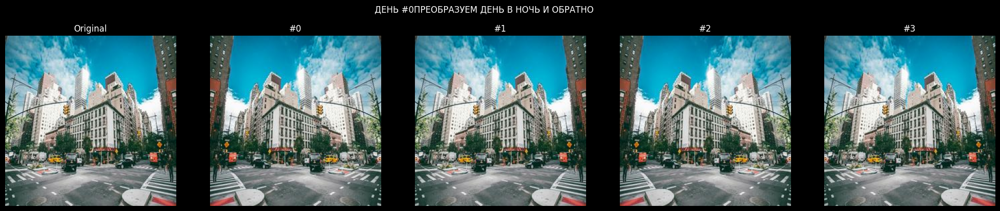

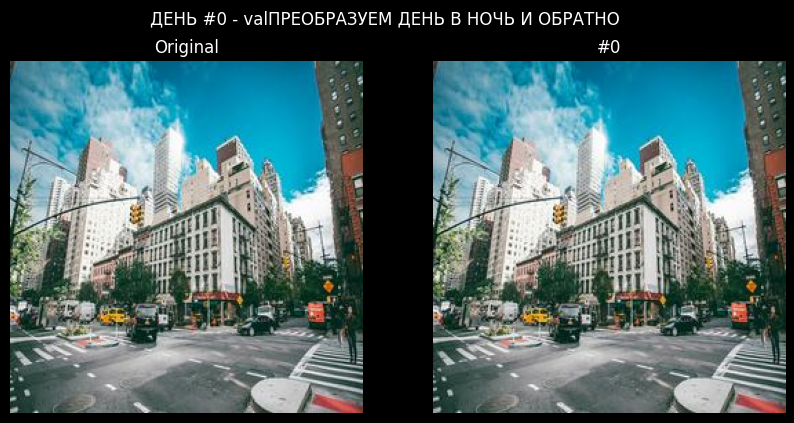

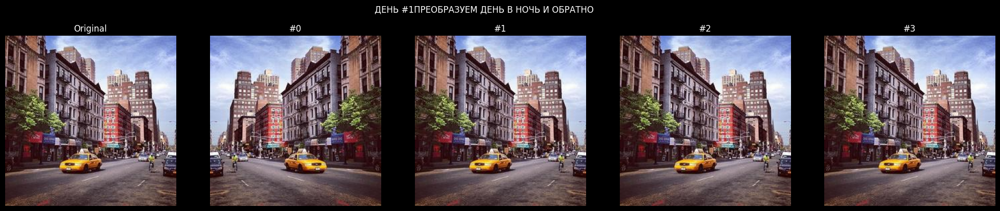

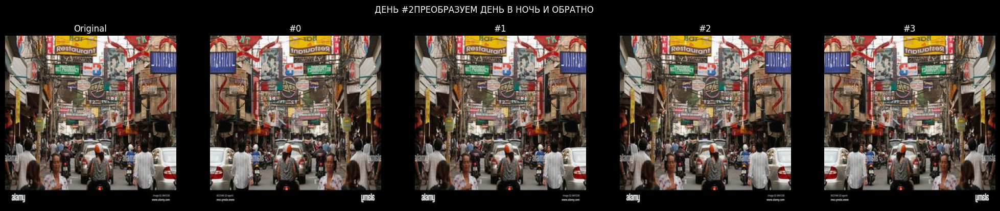

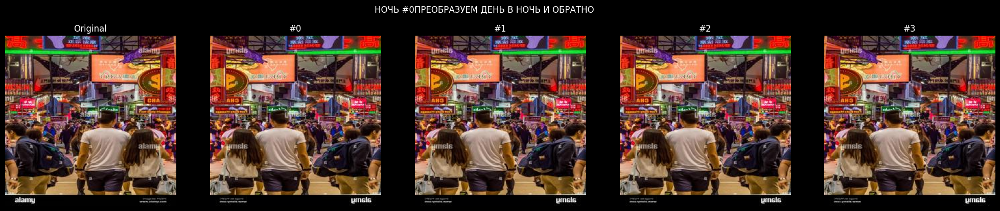

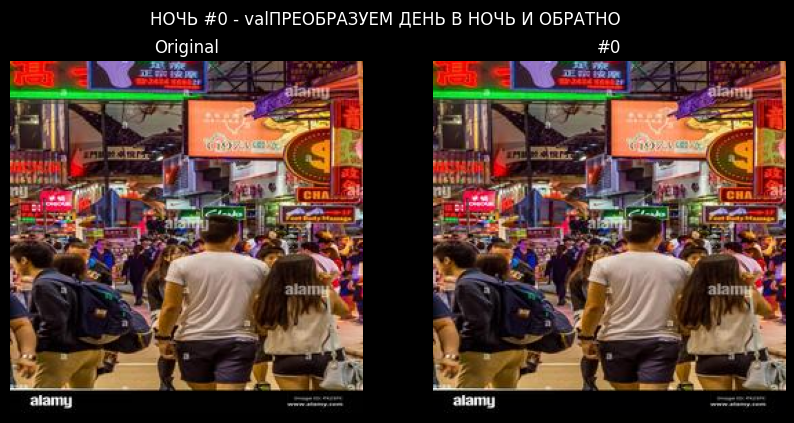

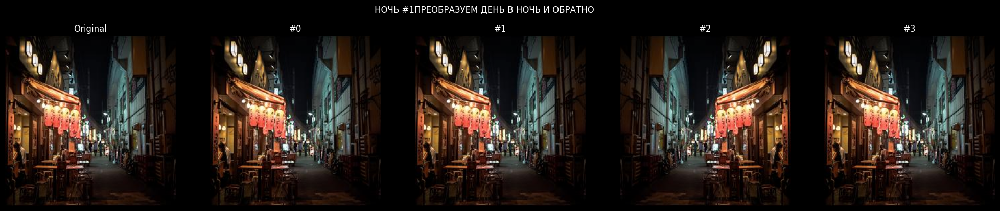

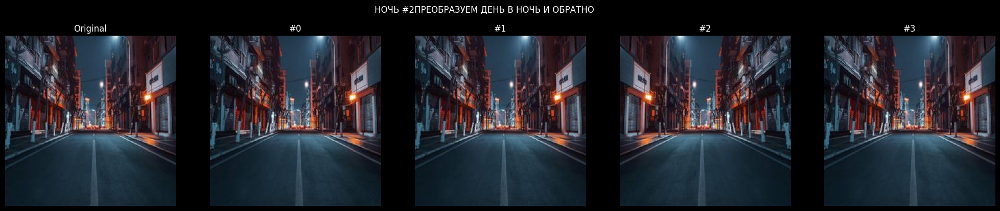

In [4]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torchvision.transforms as tr


def get_transforms(mean, std, image_size=256, augment=True):
    if augment:
        train_transform = tr.Compose(
            [
                tr.Resize((image_size, image_size)),
                tr.RandomHorizontalFlip(),
                tr.ToTensor(),
                tr.Normalize(mean, std),
            ]
        )
    else:
        train_transform = tr.Compose(
            [
                tr.Resize((image_size, image_size)),
                tr.ToTensor(),
                tr.Normalize(mean, std),
            ]
        )

    val_transform = tr.Compose(
        [tr.Resize((image_size, image_size)), tr.ToTensor(), tr.Normalize(mean, std)]
    )

    def de_normalize(tensor, normalized=True):
        tensor = tensor.clone()
        if normalized:
            for t, m, s in zip(tensor, mean, std):
                t.mul_(s).add_(m)
            tensor = tensor.clamp(0, 1)
        tensor = tensor.permute(1, 2, 0)
        return tensor.cpu().numpy()

    return train_transform, val_transform, de_normalize


def show_examples(
    dataset, transform, de_norm, num_per_image=3, image_index=0, title=""
):

    orig = dataset[image_index]
    if isinstance(orig, torch.Tensor):
        orig_disp = de_norm(orig)
    else:
        orig_disp = np.array(orig)

    num_images = 1 + num_per_image
    fig, axs = plt.subplots(1, num_images, figsize=(5 * num_images, 5))
    fig.suptitle(title + "ПРЕОБРАЗУЕМ ДЕНЬ В НОЧЬ И ОБРАТНО", y=0.95)

    axs[0].imshow(orig_disp)
    axs[0].set_title("Original")
    axs[0].axis("off")

    for i in range(num_per_image):
        transformed = transform(dataset[image_index])
        transformed_disp = de_norm(transformed)
        axs[i + 1].imshow(transformed_disp)
        axs[i + 1].set_title(f"#{i}")
        axs[i + 1].axis("off")

    plt.show()


hyperparams = dict(image_size=256, augment=True)

train_transform_a, val_transform_a, de_normalize_a = get_transforms(
    channel_mean_a, channel_std_a, **hyperparams
)
train_transform_b, val_transform_b, de_normalize_b = get_transforms(
    channel_mean_b, channel_std_b, **hyperparams
)


show_examples(
    ds.train_a,
    train_transform_a,
    de_normalize_a,
    num_per_image=4,
    image_index=0,
    title="ДЕНЬ #0",
)
show_examples(
    ds.train_a,
    val_transform_a,
    de_normalize_a,
    num_per_image=1,
    image_index=0,
    title="ДЕНЬ #0 - val",
)
show_examples(
    ds.train_a,
    train_transform_a,
    de_normalize_a,
    num_per_image=4,
    image_index=1,
    title="ДЕНЬ #1",
)
show_examples(
    ds.train_a,
    train_transform_a,
    de_normalize_a,
    num_per_image=4,
    image_index=2,
    title="ДЕНЬ #2",
)
show_examples(
    ds.train_b,
    train_transform_b,
    de_normalize_b,
    num_per_image=4,
    image_index=0,
    title="НОЧЬ #0",
)
show_examples(
    ds.train_b,
    val_transform_b,
    de_normalize_b,
    num_per_image=1,
    image_index=0,
    title="НОЧЬ #0 - val",
)
show_examples(
    ds.train_b,
    train_transform_b,
    de_normalize_b,
    num_per_image=4,
    image_index=1,
    title="НОЧЬ #1",
)
show_examples(
    ds.train_b,
    train_transform_b,
    de_normalize_b,
    num_per_image=4,
    image_index=2,
    title="НОЧЬ #2",
)

In [5]:
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainA"),
        transforms=train_transform_a,
    ),
    train_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainB"),
        transforms=val_transform_b,
    ),
    test_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "testA"),
        transforms=val_transform_a,
    ),
    test_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "testB"),
        transforms=val_transform_b,
    ),
)

## 1.3 DataLoader

In [6]:
@dataclass
class DataLoadersClass:
    train_a: DataLoader
    train_b: DataLoader
    test_a: DataLoader
    test_b: DataLoader


batch_size = 50

dataloaders = DataLoadersClass(
    train_a=DataLoader(
        dataset=ds.train_a,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    train_b=DataLoader(
        dataset=ds.train_b,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    test_a=DataLoader(
        dataset=ds.test_a,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
    test_b=DataLoader(
        dataset=ds.test_b,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
)

# 2. Модель (___6 баллов___)

## 2.0 Любые вспомогательные модули и классы

## 2.1 Архитектура сети (___3 балла___)

In [7]:
import torch
import torch.nn as nn
from collections import OrderedDict


class ResnetBlock(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.block = nn.Sequential(OrderedDict([
            ('pad1', nn.ReflectionPad2d(1)),
            ('conv1', nn.Conv2d(dim, dim, kernel_size=3)),
            ('norm1', nn.InstanceNorm2d(dim)),
            ('relu1', nn.ReLU(True)),
            ('pad2', nn.ReflectionPad2d(1)),
            ('conv2', nn.Conv2d(dim, dim, kernel_size=3)),
            ('norm2', nn.InstanceNorm2d(dim))
        ]))

    def forward(self, x):
        return x + self.block(x)


class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, ngf=64, n_blocks=9):
        super().__init__()
        layers = OrderedDict()

        layers['pad_in'] = nn.ReflectionPad2d(3)
        layers['conv_in'] = nn.Conv2d(input_nc, ngf, kernel_size=7)
        layers['norm_in'] = nn.InstanceNorm2d(ngf)
        layers['relu_in'] = nn.ReLU(True)

        in_ch = ngf
        for i in range(2):
            out_ch = in_ch * 2
            layers[f'down_conv{i+1}'] = nn.Conv2d(in_ch, out_ch, kernel_size=3, stride=2, padding=1)
            layers[f'down_norm{i+1}'] = nn.InstanceNorm2d(out_ch)
            layers[f'down_relu{i+1}'] = nn.ReLU(True)
            in_ch = out_ch

        for i in range(n_blocks):
            layers[f'resblock{i+1}'] = ResnetBlock(in_ch)

        for i in range(2):
            out_ch = in_ch // 2
            layers[f'up_deconv{i+1}'] = nn.ConvTranspose2d(
                in_ch, out_ch, kernel_size=3, stride=2, padding=1, output_padding=1)
            layers[f'up_norm{i+1}'] = nn.InstanceNorm2d(out_ch)
            layers[f'up_relu{i+1}'] = nn.ReLU(True)
            in_ch = out_ch

        layers['pad_out'] = nn.ReflectionPad2d(3)
        layers['conv_out'] = nn.Conv2d(ngf, output_nc, kernel_size=7)
        layers['tanh'] = nn.Tanh()

        self.model = nn.Sequential(layers)

    def forward(self, x):
        return self.model(x)


class Discriminator(nn.Module):
    def __init__(self, input_nc, ndf=64):
        super().__init__()
        layers = OrderedDict()

        layers['conv1'] = nn.Conv2d(input_nc, ndf, kernel_size=4, stride=2, padding=1)
        layers['lrelu1'] = nn.LeakyReLU(0.2, True)

        in_ch = ndf
        for i in range(1, 4):
            out_ch = in_ch * 2
            stride = 1 if i == 3 else 2
            layers[f'conv{i+1}'] = nn.Conv2d(in_ch, out_ch, kernel_size=4, stride=stride, padding=1)
            layers[f'norm{i+1}'] = nn.InstanceNorm2d(out_ch)
            layers[f'lrelu{i+1}'] = nn.LeakyReLU(0.2, True)
            in_ch = out_ch

        layers['conv_out'] = nn.Conv2d(in_ch, 1, kernel_size=4, stride=1, padding=1)

        self.model = nn.Sequential(layers)

    def forward(self, x):
        return self.model(x)


class CycleGAN(nn.Module):
    def __init__(self, input_nc, output_nc, ngf=64, ndf=64, n_blocks=9):
        super().__init__()
        self.G_A2B = Generator(input_nc, output_nc, ngf, n_blocks)
        self.G_B2A = Generator(output_nc, input_nc, ngf, n_blocks)
        self.D_A = Discriminator(input_nc, ndf)
        self.D_B = Discriminator(output_nc, ndf)

    def forward(self, real_A, real_B):
        fake_B = self.G_A2B(real_A)
        fake_A = self.G_B2A(real_B)
        rec_A = self.G_B2A(fake_B)
        rec_B = self.G_A2B(fake_A)
        return fake_A, fake_B, rec_A, rec_B


## 2.2 Loss (___3 балла___)

$$ \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) = \mathbb{E}_{a \sim A} \bigg( \Big\| G_{B \rightarrow A} \big( G_{A \rightarrow B} ( a ) \big) - a \Big\|_1 \bigg) + \mathbb{E}_{b \sim B} \bigg( \Big\| G_{A \rightarrow B} \big( G_{B \rightarrow A} ( b ) \big) - b \Big\|_1 \bigg) \longrightarrow \min_{G}$$

In [8]:
class CycleConsistencyLoss(nn.Module):
    def __init__(self, lambda_cycle=1.0):
        super(CycleConsistencyLoss, self).__init__()
        self.lambda_cycle = lambda_cycle
        self.l1_loss = nn.L1Loss()

    def forward(self, x, x_rec):
        loss = self.l1_loss(x_rec, x)
        return self.lambda_cycle * loss

$$ \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) = \mathbb{E}_{b \sim B} \log D_{B} (b) + \mathbb{E}_{a \sim A} \log \Big( 1 - D_{B} \big( G_{A \rightarrow B} (a) \big) \Big) \longrightarrow \min_{G} \max_{D}$$

In [9]:
class AdversarialLossCE(nn.Module):
    def __init__(self):
        super(AdversarialLossCE, self).__init__()
        self.bce = nn.BCELoss()

    def forward(self, real_pred, fake_pred=None):
        if fake_pred is None:
            target = torch.ones_like(real_pred)
            return self.bce(real_pred, target)
        else:
            target_real = torch.ones_like(real_pred)
            target_fake = torch.zeros_like(fake_pred)
            loss_real = self.bce(real_pred, target_real)
            loss_fake = self.bce(fake_pred, target_fake)
            return loss_real + loss_fake

$$ \mathbb{E}_{b \sim B} \big( D_{B} (b) - 1 \big)^2 + \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) \Big)^2 \longrightarrow \min_{D} $$
$$ \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) - 1 \Big)^2 \longrightarrow \min_{G} $$

In [10]:
class AdversarialLossMSE(nn.Module):
    def __init__(self):
        super(AdversarialLossMSE, self).__init__()
        self.mse = nn.MSELoss()

    def forward(self, real_pred, fake_pred=None):
        if fake_pred is None:
            target = torch.ones_like(real_pred)
            loss = self.mse(real_pred, target)
        else:
            target_real = torch.ones_like(real_pred)
            loss_real = self.mse(real_pred, target_real)

            target_fake = torch.zeros_like(fake_pred)
            loss_fake = self.mse(fake_pred, target_fake)
            loss = loss_real + loss_fake
        return loss

$$ \mathbf{L} \big( G_{A \rightarrow B}, G_{B \rightarrow A}, D_{A}, D_{B} \big) = \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) + \mathbf{L}_{\text{GAN}} \big( G_{B \rightarrow A}, D_{A} \big) + \lambda \cdot \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) \longrightarrow \min_{G} \max_{D}$$

In [11]:
class FullDiscriminatorLoss(nn.Module):
    def __init__(self, is_mse=True, **kwargs):
        super(FullDiscriminatorLoss, self).__init__()
        if is_mse:
            self.adversarial_loss_func = AdversarialLossMSE(**kwargs)
        else:
            self.adversarial_loss_func = AdversarialLossCE(**kwargs)

    def forward(self, real_A_pred, fake_A_pred, real_B_pred, fake_B_pred):

        loss_A = self.adversarial_loss_func(real_A_pred, fake_A_pred)
        loss_B = self.adversarial_loss_func(real_B_pred, fake_B_pred)
        return loss_A + loss_B

In [12]:
class FullGeneratorLoss(nn.Module):
    def __init__(self, lambda_value=1.0, is_mse=True, **kwargs):
        super(FullGeneratorLoss, self).__init__()
        if is_mse:
            self.adversarial_loss_func = AdversarialLossMSE(**kwargs)
        else:
            self.adversarial_loss_func = AdversarialLossCE(**kwargs)
        self.cycle_consistency_loss_func = CycleConsistencyLoss(
            lambda_cycle=lambda_value
        )
        self.lambda_value = lambda_value

    def forward(self, fake_B_pred, fake_A_pred, real_A, rec_A, real_B, rec_B):

        loss_adv_A2B = self.adversarial_loss_func(fake_B_pred)
        loss_adv_B2A = self.adversarial_loss_func(fake_A_pred)

        loss_cycle_A = self.cycle_consistency_loss_func(real_A, rec_A)
        loss_cycle_B = self.cycle_consistency_loss_func(real_B, rec_B)
        loss_cycle = loss_cycle_A + loss_cycle_B

        loss_total = loss_adv_A2B + loss_adv_B2A + loss_cycle
        return loss_total

# 3. Подготовка обучения (__2 балла__)

## 3.1 Шаг обучения дискриминатора

---



In [29]:
import numpy as np
from tqdm import trange


def train_discriminators(
    model, opt_d, loader_a, loader_b, criterion_d, device=torch.device("cpu")
):
    model.train()
    losses_tr = []

    iter_a = iter(loader_a)
    iter_b = iter(loader_b)
    batches_per_epoch = min(len(loader_a), len(loader_b))

    for _ in trange(batches_per_epoch, desc="Тренируем различитель картинок"):
        imgs_a = next(iter_a).to(device)
        imgs_b = next(iter_b).to(device)
        opt_d.zero_grad()
        fake_A = model.G_B2A(imgs_b)
        fake_B = model.G_A2B(imgs_a)
        real_A_pred = model.D_A(imgs_a)
        fake_A_pred = model.D_A(fake_A.detach())
        real_B_pred = model.D_B(imgs_b)
        fake_B_pred = model.D_B(fake_B.detach())
        loss_d = criterion_d(real_A_pred, fake_A_pred, real_B_pred, fake_B_pred)
        loss_d.backward()
        opt_d.step()

        losses_tr.append(loss_d.item())
    return model, opt_d, np.mean(losses_tr)

## 3.2 Шаг обучения генератора

In [30]:
import numpy as np
from tqdm import trange


def train_generators(
    model, opt_g, loader_a, loader_b, criterion_g, device=torch.device("cpu")
):
    model.train()
    losses_tr = []

    iter_a = iter(loader_a)
    iter_b = iter(loader_b)
    batches_per_epoch = min(len(loader_a), len(loader_b))

    for _ in trange(batches_per_epoch, desc="Тренькаем генератор"):
        imgs_a = next(iter_a).to(device)
        imgs_b = next(iter_b).to(device)
        opt_g.zero_grad()
        fake_B = model.G_A2B(imgs_a)
        fake_A = model.G_B2A(imgs_b)
        rec_A = model.G_B2A(fake_B)
        rec_B = model.G_A2B(fake_A)

        fake_B_pred = model.D_B(fake_B)
        fake_A_pred = model.D_A(fake_A)

        loss = criterion_g(fake_B_pred, fake_A_pred, imgs_a, rec_A, imgs_b, rec_B)

        loss.backward()
        opt_g.step()
        losses_tr.append(loss.item())

    return model, opt_g, np.mean(losses_tr)

## 3.3 Шаг валидации

In [31]:
def val(
    model, loader_a, loader_b, criterion_d, criterion_g, device=torch.device("cpu")
):
    model.eval()

    val_data = defaultdict(list)

    with torch.no_grad():
        iter_a = iter(loader_a)
        iter_b = iter(loader_b)
        batches_per_epoch = min(len(loader_a), len(loader_b))

        for _ in trange(batches_per_epoch, desc="Валидирую"):
            imgs_a = next(iter_a).to(device)
            imgs_b = next(iter_b).to(device)

            fake_A = model.G_B2A(imgs_b)
            fake_B = model.G_A2B(imgs_a)

            rec_A = model.G_B2A(fake_B)
            rec_B = model.G_A2B(fake_A)

            a_real_pred = model.D_A(imgs_a)
            b_real_pred = model.D_B(imgs_b)
            a_fake_pred = model.D_A(fake_A)
            b_fake_pred = model.D_B(fake_B)

            loss_d = criterion_d(a_real_pred, a_fake_pred, b_real_pred, b_fake_pred)
            loss_g = criterion_g(b_fake_pred, a_fake_pred, imgs_a, rec_A, imgs_b, rec_B)

            val_data["loss D"].append(loss_d.item())
            val_data["loss G"].append(loss_g.item())

            is_mse_pred = a_real_pred.shape[1] == 1

            if is_mse_pred:
                a_real_log = a_real_pred[:, 0]
                b_real_log = b_real_pred[:, 0]
                a_fake_log = a_fake_pred[:, 0]
                b_fake_log = b_fake_pred[:, 0]
            else:
                a_real_log = F.softmax(a_real_pred, dim=1)[:, 1]
                b_real_log = F.softmax(b_real_pred, dim=1)[:, 1]
                a_fake_log = F.softmax(a_fake_pred, dim=1)[:, 1]
                b_fake_log = F.softmax(b_fake_pred, dim=1)[:, 1]

            val_data["real pred A"].extend(a_real_log.cpu().detach().tolist())
            val_data["real pred B"].extend(b_real_log.cpu().detach().tolist())
            val_data["fake pred A"].extend(a_fake_log.cpu().detach().tolist())
            val_data["fake pred B"].extend(b_fake_log.cpu().detach().tolist())

        val_data["loss D"] = np.mean(val_data["loss D"])
        val_data["loss G"] = np.mean(val_data["loss G"])

    return val_data

## 3.4 Визуализация сгенерированного

In [32]:
def draw_imgs(
    model,
    num_images,
    loader_a,
    loader_b,
    de_norm_a,
    de_norm_b,
    device=torch.device("cpu"),
):
    model.eval()
    with torch.no_grad():
        imgs_a = next(iter(loader_a))[:num_images].to(device)
        imgs_b = next(iter(loader_b))[:num_images].to(device)

        fake_a = model.G_B2A(imgs_b)
        fake_b = model.G_A2B(imgs_a)
        rec_a = model.G_B2A(fake_b)
        rec_b = model.G_A2B(fake_a)

        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Картинки из A", y=0.92)

        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Оригинал из A")
            plt.imshow(de_norm_a(imgs_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Переводим в B")
            plt.imshow(de_norm_b(fake_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Реконструкция A")
            plt.imshow(de_norm_a(rec_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Картинка из B", y=0.92)

        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Оригинал из B")
            plt.imshow(de_norm_b(imgs_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Перевожу в A")
            plt.imshow(de_norm_a(fake_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Реконструирую B")
            plt.imshow(de_norm_b(rec_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

        plt.show()

## 3.5 Цикл обучения

In [33]:
from IPython.display import clear_output
import warnings


def get_model_name(chkp_folder, model_name=None):
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f"model#{num_starts}"
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + ".pt")):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed = True
    if changed:
        warnings.warn(
            f"Долбоеб --- модель уже существует ща переименую ее в {model_name}"
        )
    return model_name


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group["lr"]


def learning_loop(
    model,
    optimizer_g,
    g_iters_per_epoch,
    optimizer_d,
    d_iters_per_epoch,
    train_loader_a,
    train_loader_b,
    val_loader_a,
    val_loader_b,
    criterion_d,
    criterion_g,
    de_norm_a,
    de_norm_b,
    scheduler_d=None,
    scheduler_g=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    model_name=None,
    chkp_folder="./chkps",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
):
    model_name = get_model_name(chkp_folder, model_name)

    if plots is None:
        plots = {
            "train G": [],
            "train D": [],
            "val D": [],
            "val G": [],
            "lr G": [],
            "lr D": [],
            "hist real A": [],
            "hist gen A": [],
            "hist real B": [],
            "hist gen B": [],
        }

    for epoch in np.arange(1, epochs + 1) + starting_epoch:
        print(f"#{epoch}/{epochs}:")

        plots["lr G"].append(get_lr(optimizer_g))
        plots["lr D"].append(get_lr(optimizer_d))

        print(f"разиличитель ({d_iters_per_epoch} раз)")
        loss_d = []
        for _ in range(d_iters_per_epoch):
            model, optimizer_d, loss = train_discriminators(
                model, optimizer_d, train_loader_a, train_loader_b, criterion_d
            )
            loss_d.append(loss)
        plots["train D"].extend(loss_d)

        print(f"генерация ({g_iters_per_epoch} раз)")
        loss_g = []
        for _ in range(g_iters_per_epoch):
            model, optimizer_g, loss = train_generators(
                model, optimizer_g, train_loader_a, train_loader_b, criterion_g
            )
            loss_g.append(loss)
        plots["train G"].extend(loss_g)

        if not (epoch % val_every):
            print("валидация")
            val_data = val(model, val_loader_a, val_loader_b, criterion_d, criterion_g)
            plots["val D"].append(val_data["loss D"])
            plots["val G"].append(val_data["loss G"])
            plots["hist real A"].append(val_data["real pred A"])
            plots["hist gen A"].append(val_data["fake pred A"])
            plots["hist real B"].append(val_data["real pred B"])
            plots["hist gen B"].append(val_data["fake pred B"])

            if not os.path.exists(chkp_folder):
                os.makedirs(chkp_folder)
            torch.save(
                {
                    "epoch": epoch,
                    "model_state_dict": model.state_dict(),
                    "optimizer_d_state_dict": optimizer_d.state_dict(),
                    "optimizer_g_state_dict": optimizer_g.state_dict(),
                    "scheduler_d_state_dict": scheduler_d.state_dict(),
                    "scheduler_g_state_dict": scheduler_g.state_dict(),
                    "plots": plots,
                },
                os.path.join(chkp_folder, model_name + ".pt"),
            )

            if scheduler_d:
                try:
                    scheduler_d.step()
                except:
                    scheduler_d.step(loss_d)
            if scheduler_g:
                try:
                    scheduler_g.step()
                except:
                    scheduler_g.step(loss_g)

        if not (epoch % draw_every):
            clear_output(True)

            hh = 2
            ww = 2
            plt_ind = 1
            fig, ax = plt.subplots(hh, ww, figsize=(25, 12))
            fig.suptitle(f"#{epoch}/{epochs}:")

            plt.subplot(hh, ww, plt_ind)
            plt.title("потери различителя losses")
            d_plot_step = 1.0 / d_iters_per_epoch
            plt.plot(
                np.arange(d_plot_step, epoch + d_plot_step, d_plot_step),
                plots["train D"],
                "r.-",
                label="train",
                alpha=0.7,
            )
            plt.plot(
                np.arange(1, epoch + 1), plots["val D"], "g.-", label="val", alpha=0.7
            )
            plt.grid()
            plt.legend()
            plt_ind += 1

            plt.subplot(hh, ww, plt_ind)
            plt.title("потери генератора")
            g_plot_step = 1.0 / g_iters_per_epoch
            plt.plot(
                np.arange(g_plot_step, epoch + g_plot_step, g_plot_step),
                plots["train G"],
                "r.-",
                label="train",
                alpha=0.7,
            )
            plt.plot(
                np.arange(1, epoch + 1), plots["val G"], "g.-", label="val", alpha=0.7
            )
            plt.grid()
            plt.legend()
            plt_ind += 1

            plt.subplot(hh, ww, plt_ind)
            plt.title("Предсказания для различителя A")
            plt.hist(
                np.array(plots["hist real A"][-1]).flatten(),
                bins=50,
                density=True,
                label="real",
                color="green",
                alpha=0.7,
            )
            plt.hist(
                np.array(plots["hist gen A"][-1]).flatten(),
                bins=50,
                density=True,
                label="generated",
                color="red",
                alpha=0.7,
            )
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1

            plt.subplot(hh, ww, plt_ind)
            plt.title("Предсказания для различителя B")
            plt.hist(
                np.array(plots["hist real B"][-1]).flatten(),
                bins=50,
                density=True,
                label="real",
                color="green",
                alpha=0.7,
            )
            plt.hist(
                np.array(plots["hist gen B"][-1]).flatten(),
                bins=50,
                density=True,
                label="generated",
                color="red",
                alpha=0.7,
            )
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1

            plt.show()

            draw_imgs(
                model,
                images_per_validation,
                val_loader_a,
                val_loader_b,
                de_norm_a,
                de_norm_b,
            )

        if min_lr and get_lr(optimizer_d) <= min_lr:
            print(
                f"Ранее остановка для различителя на эпохе номер {epoch}"
            )
            break

        if min_lr and get_lr(optimizer_g) <= min_lr:
            print(
                f"Раняя остановка для генератора на эпохе номер {epoch}"
            )
            break

    return model, optimizer_d, optimizer_g, plots

# 4. Обучение (___2 балла___)

## 4.1 Инициализация модели и оптимайзера

In [34]:
from collections import defaultdict
from termcolor import colored


def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0) : j + 3] for j in range(len(i) - 3, -3, -3)]))


def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda: [0, 0])
    for name, param in model.named_parameters():
        num_params = param.numel()
        if verbose_all or (verbose_only_learnable and param.requires_grad):
            print(
                colored(
                    "{: <65} ~  {: <9} params ~ grad: {}".format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param.requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f"\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params"
    )

    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params

In [35]:
device = torch.device("cpu")


def create_model_and_optimizer(model_class, model_params, lr=1e-3, device=device):
    model = model_class(**model_params)
    model = model.to(device)

    optimizer_d = torch.optim.Adam(
        list(model.D_A.parameters()) + list(model.D_B.parameters()),
        lr=lr,
        betas=(0.5, 0.999),
    )
    optimizer_g = torch.optim.Adam(
        list(model.G_A2B.parameters()) + list(model.G_B2A.parameters()),
        lr=lr,
        betas=(0.5, 0.999),
    )
    return model, optimizer_d, optimizer_g

## 4.2 Фактическое обучение

In [36]:
device = torch.device("cpu")

results = []


model_params_default = {
    "input_nc": 3,
    "output_nc": 3,
    "ngf": 20,
    "ndf": 20,
    "n_blocks": 7,
}


model, optimizer_d, optimizer_g = create_model_and_optimizer(
    model_class=CycleGAN,
    model_params=model_params_default,
    lr=1e-3,
    device=device,
)


scheduler_d = torch.optim.lr_scheduler.StepLR(optimizer_d, step_size=30, gamma=0.5)
scheduler_g = torch.optim.lr_scheduler.StepLR(optimizer_g, step_size=30, gamma=0.5)

criterion_d = FullDiscriminatorLoss(is_mse=True)
criterion_g = FullGeneratorLoss(lambda_value=10.0, is_mse=True)

sum_params, sum_learnable_params = model_num_params(model)

G_A2B.model.conv_in.weight                                        ~  2.940     params ~ grad: True
G_A2B.model.conv_in.bias                                          ~  20        params ~ grad: True
G_A2B.model.down_conv1.weight                                     ~  7.200     params ~ grad: True
G_A2B.model.down_conv1.bias                                       ~  40        params ~ grad: True
G_A2B.model.down_conv2.weight                                     ~  28.800    params ~ grad: True
G_A2B.model.down_conv2.bias                                       ~  80        params ~ grad: True
G_A2B.model.resblock1.block.conv1.weight                          ~  57.600    params ~ grad: True
G_A2B.model.resblock1.block.conv1.bias                            ~  80        params ~ grad: True
G_A2B.model.resblock1.block.conv2.weight                          ~  57.600    params ~ grad: True
G_A2B.model.resblock1.block.conv2.bias                            ~  80        params ~ grad: True
G_A2B.mode

In [37]:
model

CycleGAN(
  (G_A2B): Generator(
    (model): Sequential(
      (pad_in): ReflectionPad2d((3, 3, 3, 3))
      (conv_in): Conv2d(3, 20, kernel_size=(7, 7), stride=(1, 1))
      (norm_in): InstanceNorm2d(20, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (relu_in): ReLU(inplace=True)
      (down_conv1): Conv2d(20, 40, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (down_norm1): InstanceNorm2d(40, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (down_relu1): ReLU(inplace=True)
      (down_conv2): Conv2d(40, 80, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (down_norm2): InstanceNorm2d(80, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (down_relu2): ReLU(inplace=True)
      (resblock1): ResnetBlock(
        (block): Sequential(
          (pad1): ReflectionPad2d((1, 1, 1, 1))
          (conv1): Conv2d(80, 80, kernel_size=(3, 3), stride=(1, 1))
          (norm1): InstanceNorm2d(80, eps=1e-05, moment

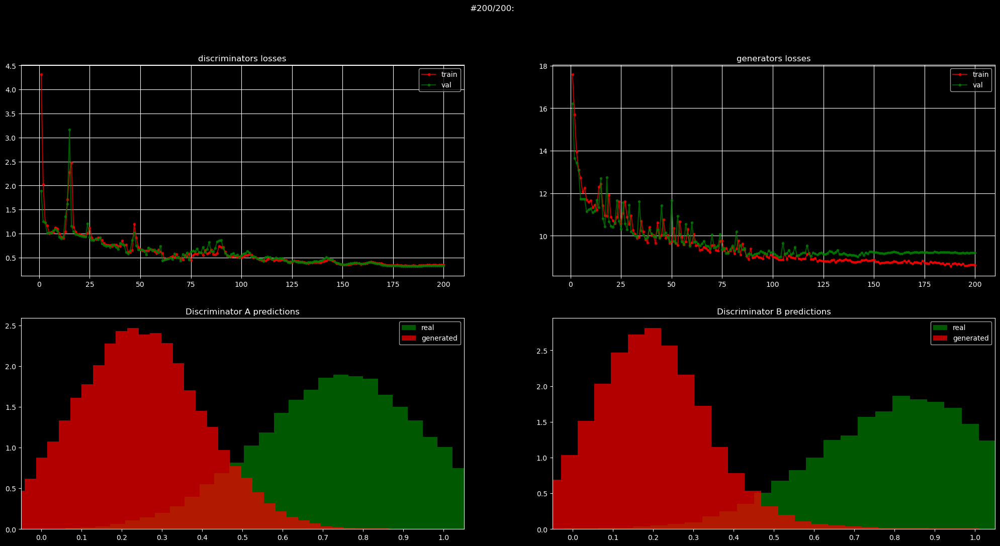

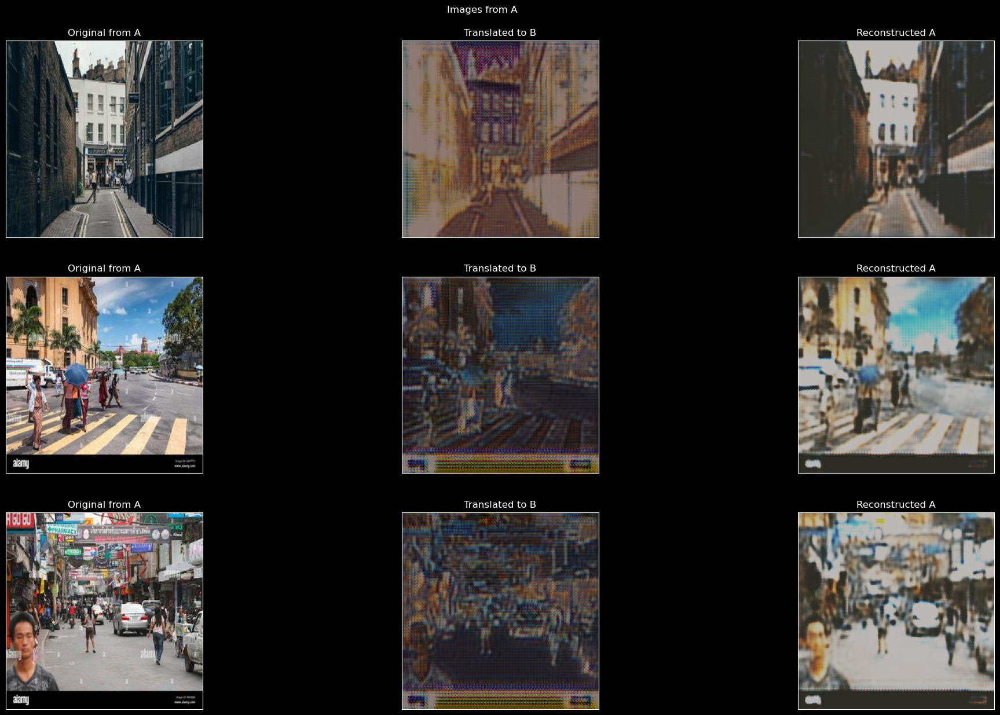

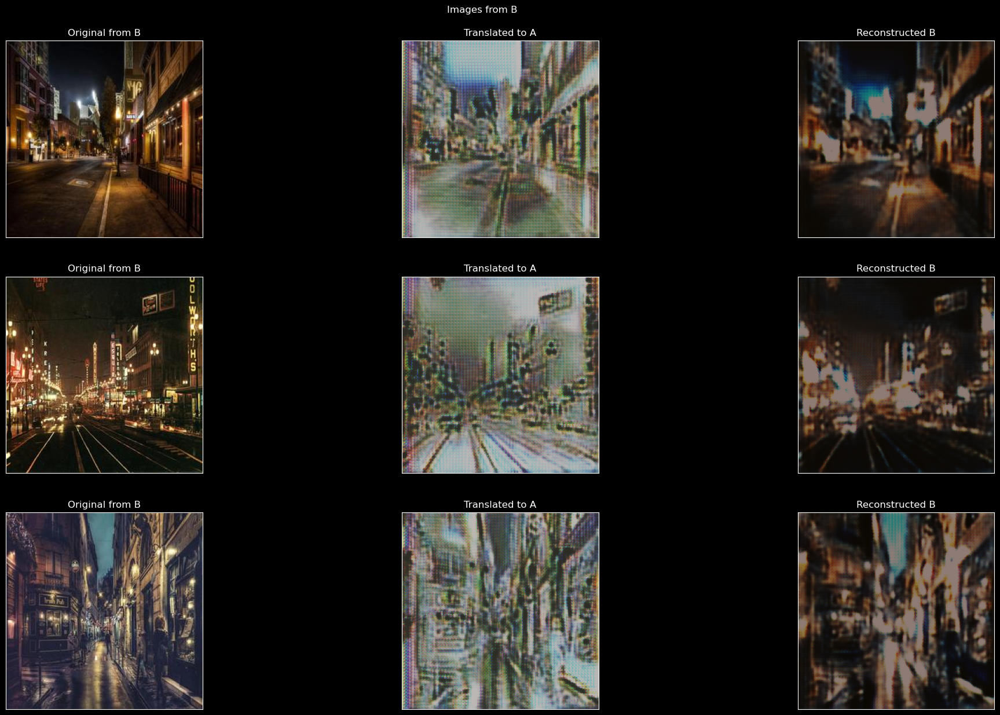

CPU times: user 3d 3h 23min 44s, sys: 19h 45min 40s, total: 3d 23h 9min 25s
Wall time: 14h 22min 24s


In [ ]:
%%time
model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    optimizer_g = optimizer_g,
    g_iters_per_epoch = 1,
    optimizer_d = optimizer_d,
    d_iters_per_epoch = 1,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    criterion_d = criterion_d,
    criterion_g = criterion_g,
    scheduler_g = scheduler_g,
    scheduler_d = scheduler_d,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = 200,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    chkp_folder = "./chkp",
    model_name = "cycle_gan_pro_cities",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
)

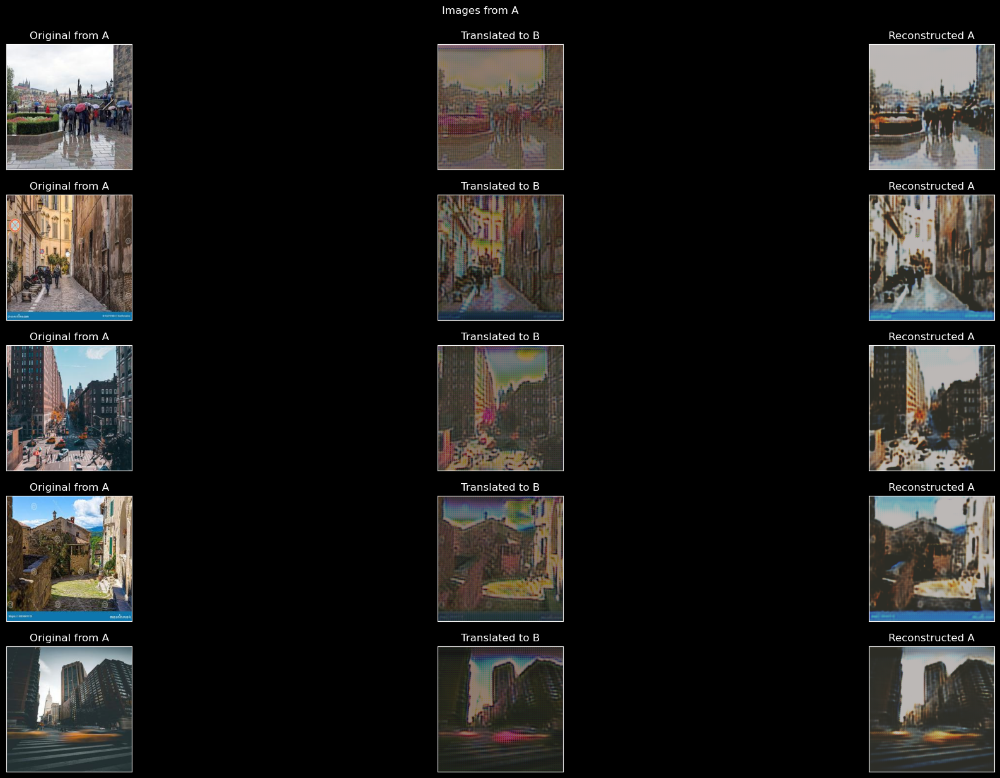

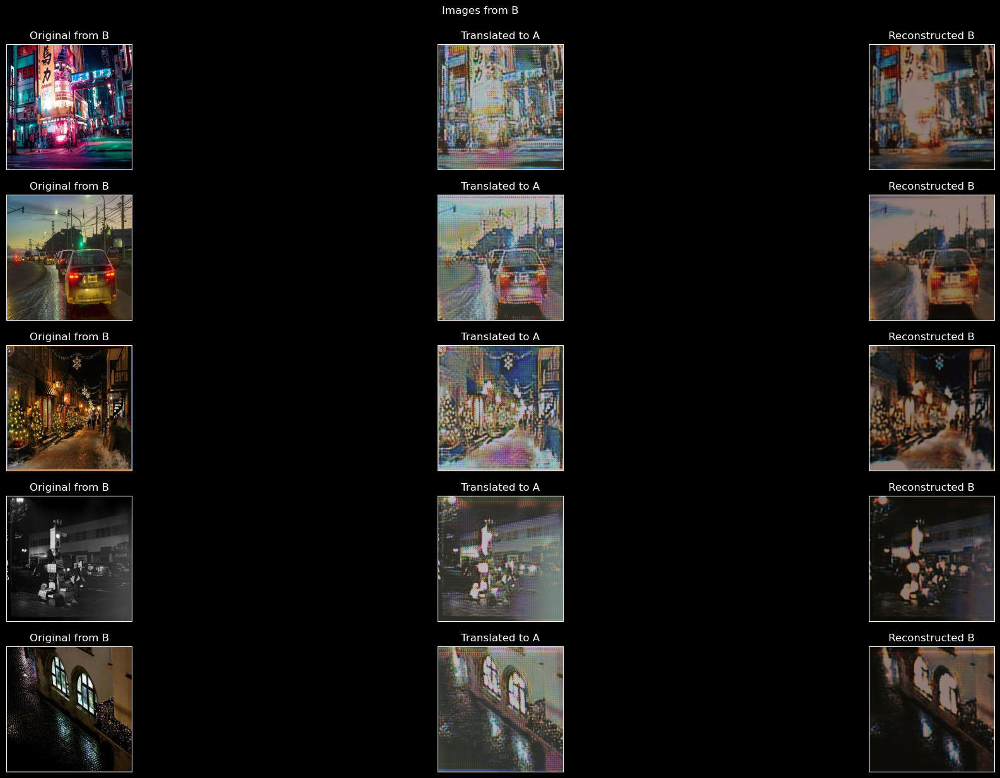

In [26]:
def load_model():
    model_path = "chkp/cycle_gan_pro_cities.pt"
    checkpoint = torch.load(model_path, map_location=device, weights_only=False)
    model_params = {
        "input_nc": 3,
        "output_nc": 3,
        "ngf": 32,
        "ndf": 32,
        "n_blocks": 9,
    }
    model = CycleGAN(**model_params)
    model.load_state_dict(checkpoint["model_state_dict"])
    model.to(device)
    model.eval()
    return model


device = torch.device("cpu")

model = load_model()

mean_a = [0.4580916464328766, 0.44835418462753296, 0.4300723373889923]
std_a = [0.28303202986717224, 0.27337419986724854, 0.2840876579284668]
mean_b = [0.3035360872745514, 0.25791674852371216, 0.23505744338035583]
std_b = [0.2569240927696228, 0.2247738391160965, 0.22577059268951416]

transform_a, _, de_norm_a = get_transforms(mean_a, std_a, image_size=256, augment=False)
transform_b, _, de_norm_b = get_transforms(mean_b, std_b, image_size=256, augment=False)

draw_imgs(
    model,
    5,
    dataloaders.train_a,
    dataloaders.train_b,
    de_norm_a,
    de_norm_b,
)

# 5. Свои данные (___3 балла + бонусы___)

В этой части необходимо выполнить следующее:

1. **Создание датасетов**  
   * Соберите один или пару небольших датасета (минимум 100 примеров, но чем больше, тем лучше).  
   * Дайте волю фантазии, но избегайте неадекватного контента, объема данных или данных за рамками норм.  

2. **Обучение CycleGAN**  
   * Обучите модель CycleGAN для преобразования между вашим датасетом (**домен A**) и другим датасетом (**домен B**).  
   * Второй датасет может быть вашим собственным или любым существующим  

3. **Требования к сдаче**  
   * **Архив с датасетами**:  
     Приложите ссылку на заархивированные данные или загрузите сам архив с данными, использованные для обучения.  
   * **Jupyter Notebook**:  
     * Визуализируйте примеры из доменов A и B с кратким описанием идеи (например, "преобразование эскизов в цветные рисунки").  
     * Добавьте код обучения модели (архитектура, гиперпараметры, функция потерь).  
     * Покажите результаты работы модели (минимум по 5 примеров преобразований A→B и B→A).  
   * **Hugging Face Space + Streamlit**:  
     * Разработайте интерактивное приложение с использованием Streamlit, которое позволяет:  
       - Загружать изображения из доменов A и B.  
       - Отображать результаты преобразований (A→B и B→A) в реальном времени.  
     * Выложите приложение в Hugging Face Space и приложите ссылку на него.  
     * Убедитесь, что модель интегрирована в приложение, а проверяющие могут самостоятельно тестировать её через интерфейс.  

4. **Критерии оценки**  
   * Дополнительные баллы начисляются за:  
     - Креативные и качественные датасеты.  
     - Высокое качество преобразований (четкость, сохранение структуры, отсутствие артефактов).  
     - Удобный и наглядный интерфейс Streamlit-приложения.  

**Примеры идей для датасетов**:  
- Эскизы → Реалистичные изображения.  
- Дневные фото → Ночные фото.  
- Картины в стиле импрессионизма → фотореализм.  

**Важно**:  
- Проверяющий будет оценивать работу через ваше Streamlit-приложение. Убедитесь, что инференс работает стабильно.  
- Если модель слишком велика для деплоя, используйте оптимизацию.  

___Удачи!___ 🚀